In [23]:
import geopandas as gpd
import numpy as np
import lonboard
from core.utils import used_keys
from lonboard.colormap import apply_continuous_cmap
import matplotlib as mpl
from mapclassify import classify
from sidecar import Sidecar
import contextily as cx
import matplotlib.pyplot as plt
from matplotlib_scalebar.scalebar import ScaleBar

Define data path

In [2]:
chars_dir = "/data/uscuni-eurofab/processed_data/chars/"

Define region

In [5]:
# this is prague
ms_region = 65806
ov_region = 66292
cadastre_region = 69333

In [10]:
# read the building data
cadastre_buildings = gpd.read_parquet(f"/data/uscuni-ulce/processed_data/clusters/clusters_{cadastre_region}_v3.pq")
ms_buildings = gpd.read_parquet(f"{chars_dir}buildings_chars_{ms_region}.parquet")
ov_buildings = gpd.read_parquet(f"/data/uscuni-eurofab-overture/processed_data/chars/buildings_chars_{ov_region}.parquet")

In [11]:
# define an area of interest
central_prague = ms_buildings.loc[[309311]].buffer(1000).geometry.iloc[0]

## SubRegions

In [49]:
regions_datadir = "/data/uscuni-eurofab/"
region_hulls = gpd.read_parquet(
        regions_datadir + "regions/" + "ms_ce_region_hulls.parquet"
    )
region_hulls.shape

(474, 1)

(np.float64(3967880.0),
 np.float64(5376320.0),
 np.float64(2551350.0),
 np.float64(3604050.0))

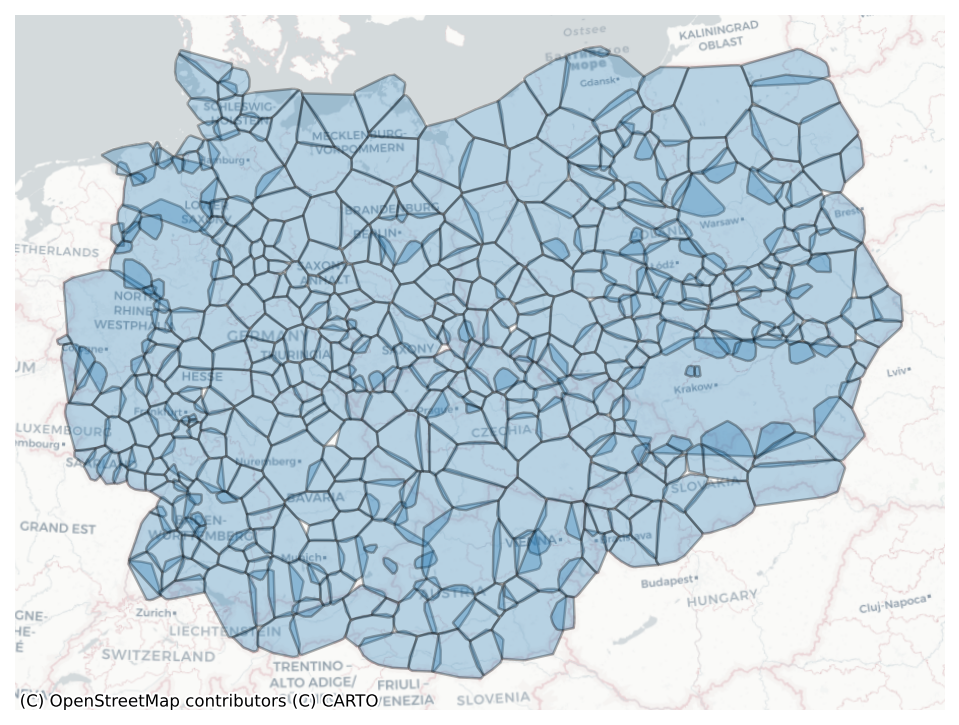

In [50]:
fig, ax = plt.subplots(figsize=(8,8), dpi=150)

region_hulls.plot(ax=ax, edgecolor='black', linewidth=1.2, alpha=.3)

cx.add_basemap(ax, crs=region_hulls.crs, source=cx.providers.CartoDB.Positron)

ax.axis('off')

In [51]:
fig.savefig('../figures/subregions.png')

## Buildings comparison

In [20]:
central_prague_buildings_cad = cadastre_buildings[cadastre_buildings.within(central_prague)]
central_prague_buildings_ms = ms_buildings[ms_buildings.within(central_prague)]
central_prague_buildings_ov = ov_buildings[ov_buildings.within(central_prague)]

(np.float64(4636521.531370498),
 np.float64(4638734.046799175),
 np.float64(3005277.8251857217),
 np.float64(3007510.132427608))

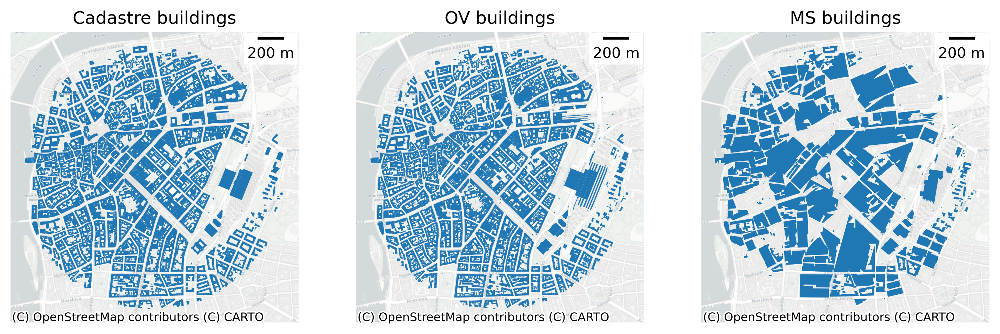

In [24]:
fig, ax = plt.subplots(1, 3, figsize=(12,4), dpi=300, sharex=True, sharey=True)

central_prague_buildings_cad.plot(ax=ax[0])
central_prague_buildings_ov.plot(ax=ax[1])
central_prague_buildings_ms.plot(ax=ax[2])

cx.add_basemap(ax[0], crs=central_prague_buildings_cad.crs, source=cx.providers.CartoDB.Positron)
cx.add_basemap(ax[1], crs=central_prague_buildings_ms.crs, source=cx.providers.CartoDB.Positron)
cx.add_basemap(ax[2], crs=central_prague_buildings_ms.crs, source=cx.providers.CartoDB.Positron)

ax[0].set_title('Cadastre buildings')
ax[1].set_title('OV buildings')
ax[2].set_title('MS buildings')

ax[0].add_artist(ScaleBar(1, location="upper right"))
ax[1].add_artist(ScaleBar(1, location="upper right"))
ax[2].add_artist(ScaleBar(1, location="upper right"))

ax[0].axis('off')
ax[1].axis('off')
ax[2].axis('off')

In [25]:
fig.savefig('../figures/building_comparison.png')

## Streets

In [58]:
processed_streets = gpd.read_parquet(f"{chars_dir}streets_chars_{ms_region}.parquet")
unprocess_streets = gpd.read_parquet(f"/data/uscuni-eurofab/overture_streets/streets_{ms_region}.pq").set_crs(epsg=4326).to_crs(epsg=3035)

In [59]:
central_prague_streets_unprocessed = unprocess_streets[unprocess_streets.within(central_prague)]
central_prague_streets_processed = processed_streets[processed_streets.within(central_prague)]


(np.float64(4636539.931877843),
 np.float64(4638726.33849539),
 np.float64(3005293.9916570475),
 np.float64(3007513.480936015))

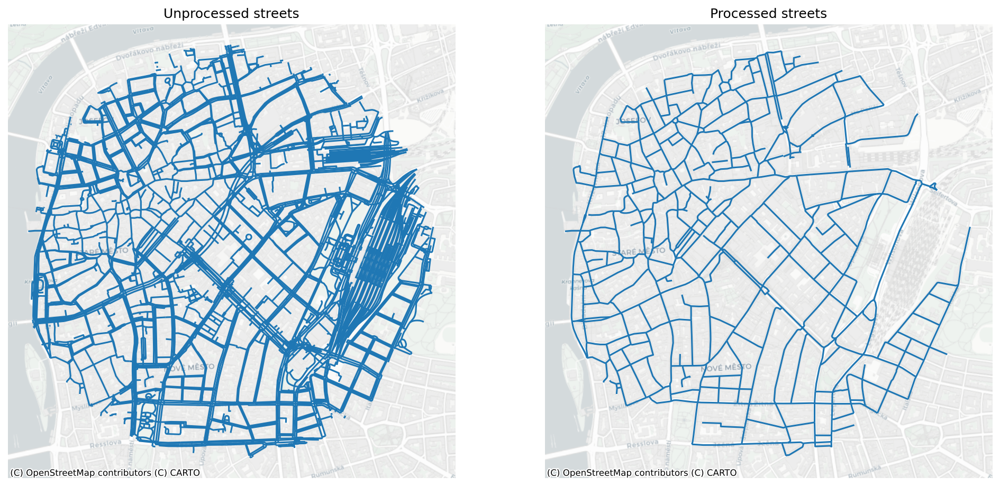

In [84]:
fig, ax = plt.subplots(1, 2, figsize=(16,8), dpi=150, sharex=True, sharey=True)

central_prague_streets_unprocessed.plot(ax=ax[0])
central_prague_streets_processed.plot(ax=ax[1])

cx.add_basemap(ax[0], crs=central_prague_streets_unprocessed.crs, source=cx.providers.CartoDB.Positron)
cx.add_basemap(ax[1], crs=central_prague_streets_processed.crs, source=cx.providers.CartoDB.Positron)

ax[0].set_title('Unprocessed streets')
ax[1].set_title('Processed streets')


ax[0].axis('off')
ax[1].axis('off')

In [85]:
fig.savefig('../figures/street_processing.png')

## Nodes

In [86]:
nodes = gpd.read_parquet(f"{chars_dir}nodes_chars_{ms_region}.parquet")

In [87]:
central_prague_nodes = nodes[nodes.within(central_prague)]


(np.float64(4636540.338943985),
 np.float64(4638717.790106398),
 np.float64(3005304.1213650415),
 np.float64(3007480.923229088))

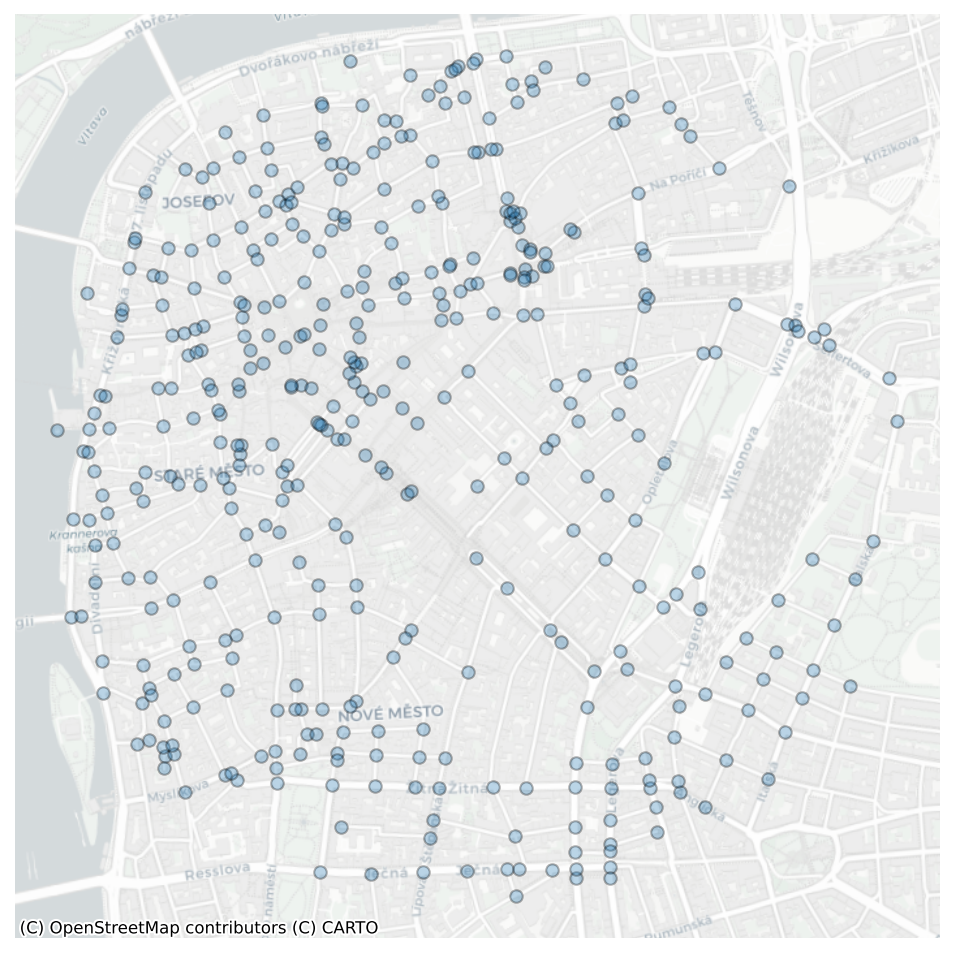

In [88]:
fig, ax = plt.subplots(figsize=(8,8), dpi=150)

central_prague_nodes.plot(ax=ax, edgecolor='black', linewidth=1, alpha=.3)

cx.add_basemap(ax, crs=central_prague_nodes.crs, source=cx.providers.CartoDB.Positron)

ax.axis('off')

In [90]:
fig.savefig('../figures/nodes.png')

## Enclosures

In [91]:
enclosures = gpd.read_parquet(f"{chars_dir}enclosures_chars_{ms_region}.parquet")

In [92]:
central_prague_enclosures = enclosures[enclosures.within(central_prague)]


(np.float64(4636576.430342512),
 np.float64(4638655.597694305),
 np.float64(3005304.1213650415),
 np.float64(3007480.923229088))

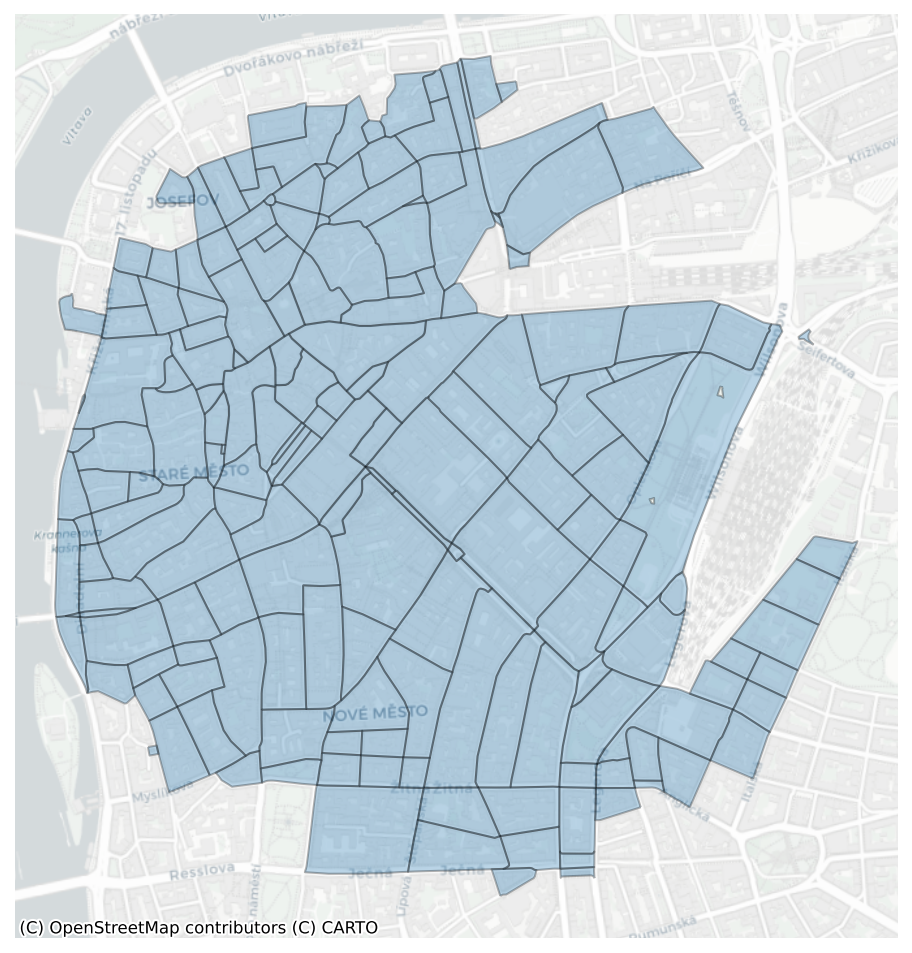

In [93]:
fig, ax = plt.subplots(figsize=(8,8), dpi=150)

central_prague_enclosures.plot(ax=ax, edgecolor='black', linewidth=1, alpha=.3)

cx.add_basemap(ax, crs=central_prague_enclosures.crs, source=cx.providers.CartoDB.Positron)

ax.axis('off')

In [94]:
fig.savefig('../figures/enclosures.png')

## Tess cells

In [75]:
tess = gpd.read_parquet(f"{chars_dir}tessellations_chars_{ms_region}.parquet")

In [77]:
central_prague_tess = tess[tess.within(central_prague)]

(np.float64(4636521.531370498),
 np.float64(4638734.046799175),
 np.float64(3005302.299285941),
 np.float64(3007507.167075299))

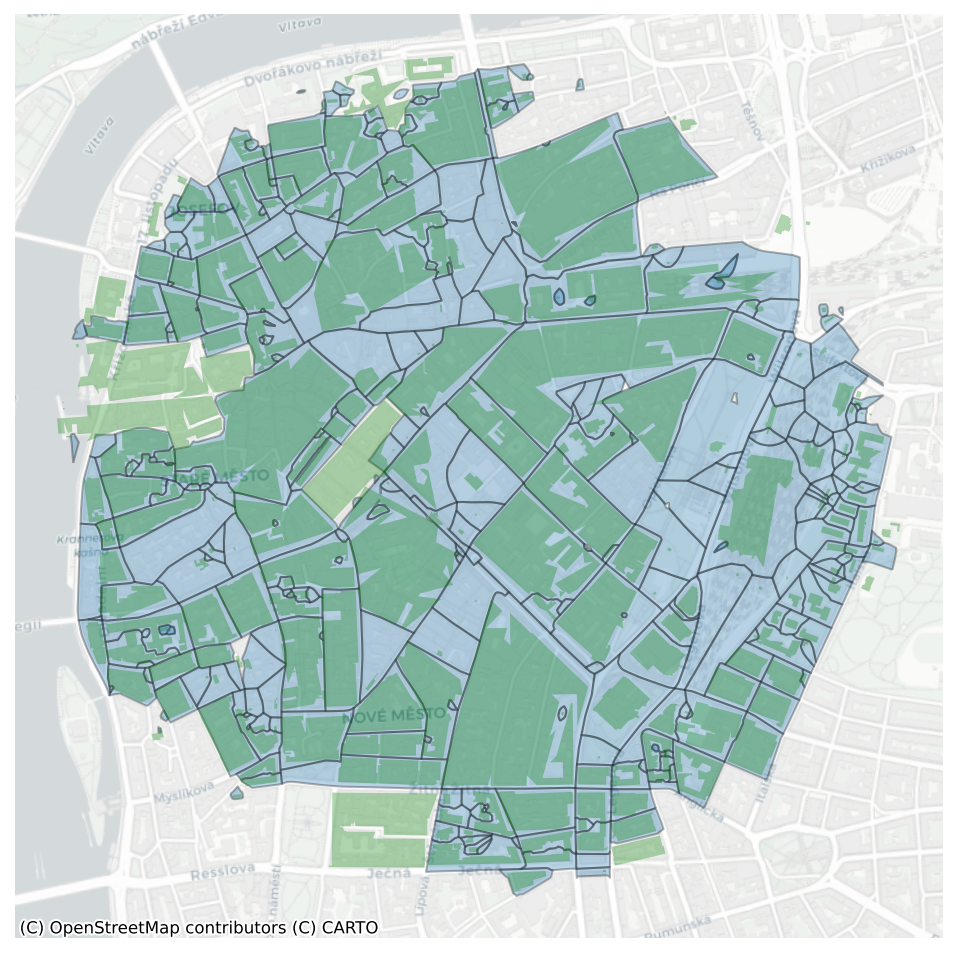

In [80]:
fig, ax = plt.subplots(figsize=(8,8), dpi=150)

central_prague_tess.plot(ax=ax, edgecolor='black', linewidth=1, alpha=.3)
central_prague_buildings_ms.plot(ax=ax, color='green', alpha=.3)

cx.add_basemap(ax, crs=central_prague_tess.crs, source=cx.providers.CartoDB.Positron)

ax.axis('off')

In [81]:
fig.savefig('../figures/tessellations.png')

## Train/Test split

In [26]:
import h3
import shapely
import pandas as pd
import tobler

In [27]:
%%time
tess = gpd.read_parquet(f"{chars_dir}tessellations_chars_{ms_region}.parquet")
bounds = tess.to_crs(epsg=4326).bounds
minx, miny, maxx, maxy = bounds.minx.min(), bounds.miny.min(), bounds.maxx.max(), bounds.maxy.max()

CPU times: user 4.16 s, sys: 599 ms, total: 4.76 s
Wall time: 4.58 s


In [28]:
resolution = 7

In [29]:
bounds = shapely.box(minx, miny, maxx, maxy)
poly = h3.geo_to_cells(bounds, res=resolution)
res = [shapely.geometry.shape(h3.cells_to_geo([p])) for p in poly]
hexagons = gpd.GeoSeries(res, index=poly,name='geometry', crs='epsg:4326').to_crs(epsg=3035)

In [30]:
inp, res = tess.sindex.query(hexagons, predicate='intersects')

# polygons should be assigned to only one h3 grid
duplicated = pd.Series(res).duplicated()
inp = inp[~duplicated]
res = res[~duplicated]

tess['hex'] = None
tess.iloc[res, -1] = hexagons.iloc[inp].index.values

In [31]:
prague = central_prague.buffer(10_000)

In [32]:
prague_hexagons = hexagons[hexagons.intersects(prague)]

In [33]:
test_hex = prague_hexagons.sample(n=int(prague_hexagons.shape[0] * .25), random_state=123)
train_hex = prague_hexagons[~prague_hexagons.index.isin(test_hex.index)]

prague_tess = tess[tess['hex'].isin(test_hex.index) & tess['hex'].notna()]

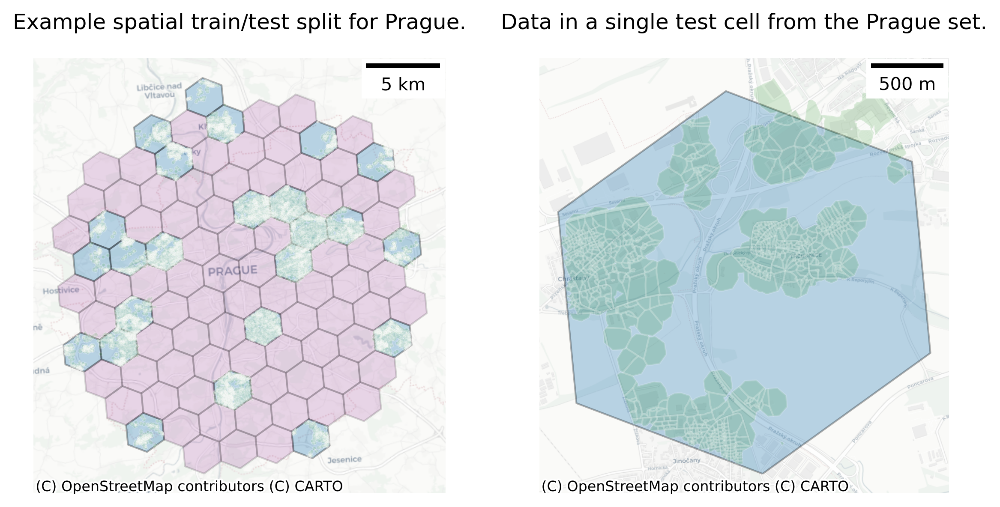

In [40]:
fig, ax = plt.subplots(1, 2, figsize=(8,4), dpi=300)

test_hex.plot(ax=ax[0], edgecolor='black', linewidth=1, alpha=.3)
train_hex.plot(ax=ax[0], color='purple', edgecolor='black', linewidth=1, alpha=.15)
prague_tess.plot(ax=ax[0], color='green', edgecolor='white', linewidth=1, alpha=.15)

cx.add_basemap(ax[0], crs=prague_tess.crs, source=cx.providers.CartoDB.Positron)

ax[0].add_artist(ScaleBar(1, location="upper right"))
ax[0].axis('off')
ax[0].set_title('Example spatial train/test split for Prague.')



test_hex[test_hex.index=='871e354a2ffffff'].plot(ax=ax[1], edgecolor='black', linewidth=1, alpha=.3)
prague_tess[prague_tess.hex == '871e354a2ffffff'].plot(ax=ax[1], color='green', edgecolor='white', linewidth=1, alpha=.15)

cx.add_basemap(ax[1], crs=prague_tess.crs, source=cx.providers.CartoDB.Positron)

ax[1].axis('off')
ax[1].add_artist(ScaleBar(1, location="upper right"))
ax[1].set_title('Data in a single test cell from the Prague set.')

fig.tight_layout()

In [41]:
fig.savefig('../figures/train_test_prague.png')

In [99]:
ax.set_xlim(4625646.061025782 - 300, 4628467.091925441 + 300)
ax.set_ylim(2999830.87404187 - 300, 3002829.8147879103 + 300)
cx.add_basemap(ax, crs=prague_tess.crs, source=cx.providers.CartoDB.Positron)


<Figure size 640x480 with 0 Axes>

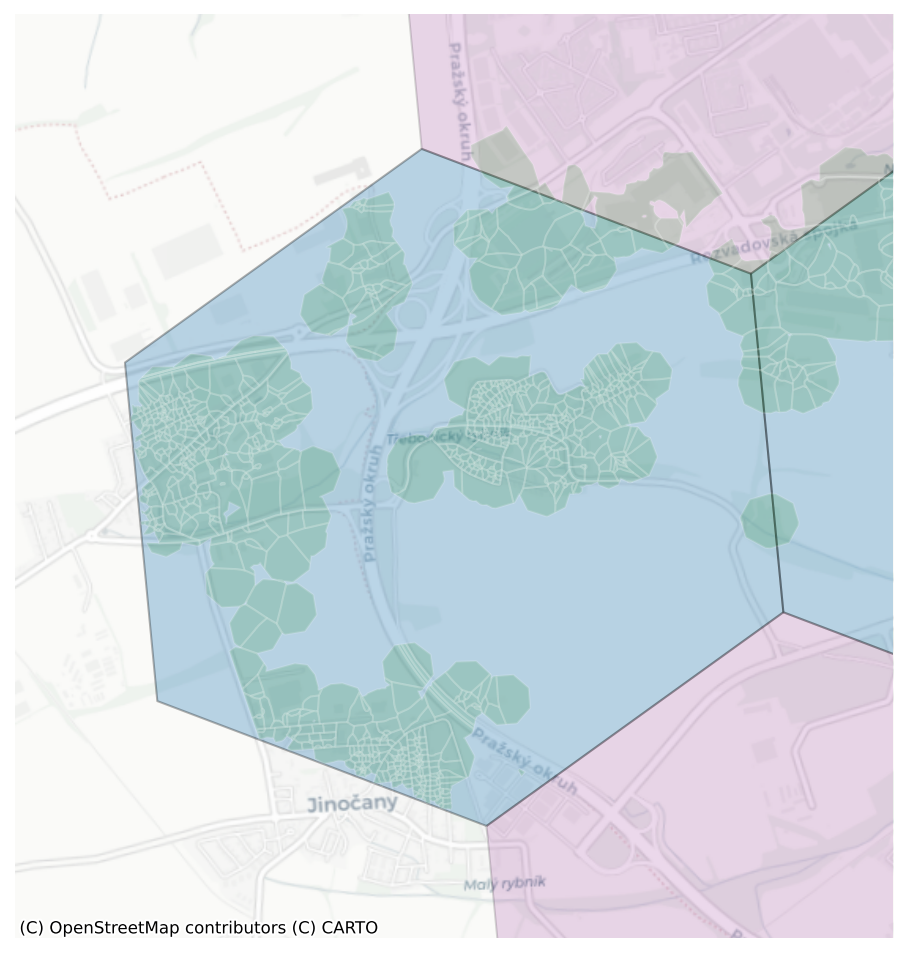

In [100]:
fig

In [101]:
fig.savefig('../figures/train_test_prague_zoom2.png')

(np.float64(4625646.061025782),
 np.float64(4628467.091925441),
 np.float64(2999830.87404187),
 np.float64(3002829.8147879103))

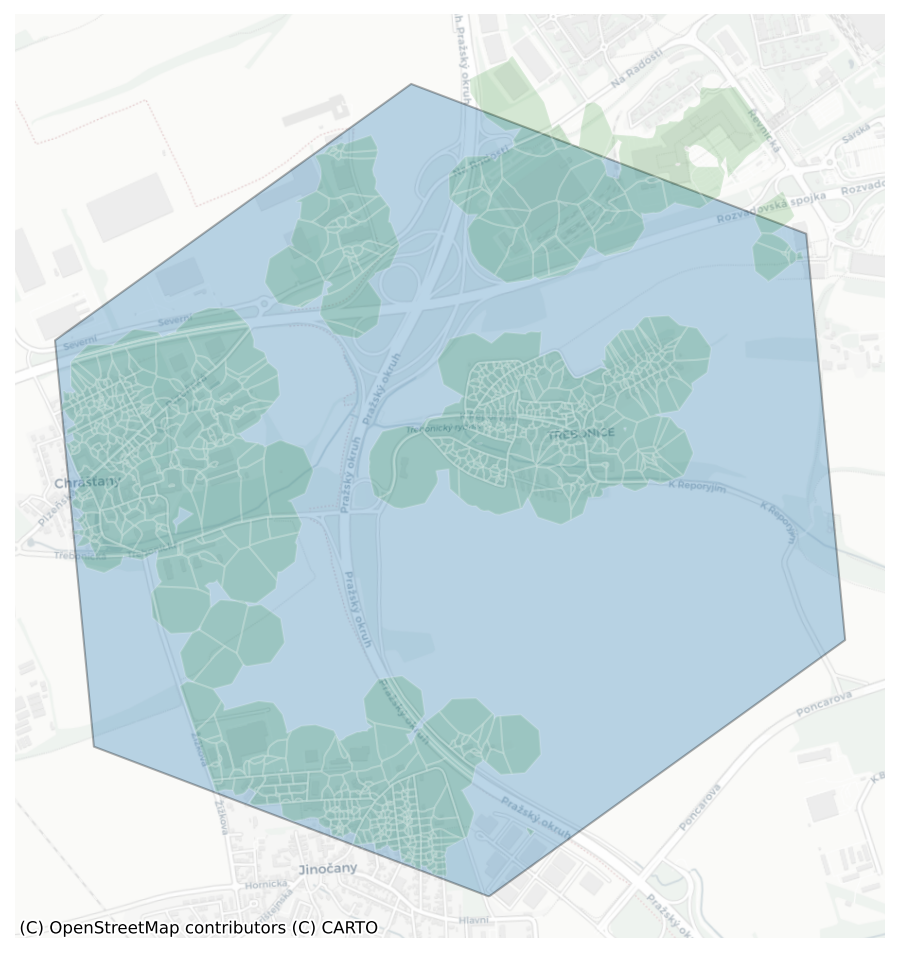

In [83]:
fig, ax = plt.subplots(figsize=(8,8), dpi=150)

test_hex[test_hex.index=='871e354a2ffffff'].plot(ax=ax, edgecolor='black', linewidth=1, alpha=.3)
prague_tess[prague_tess.hex == '871e354a2ffffff'].plot(ax=ax, color='green', edgecolor='white', linewidth=1, alpha=.15)

cx.add_basemap(ax, crs=prague_tess.crs, source=cx.providers.CartoDB.Positron)

ax.axis('off')

In [87]:
fig.savefig('../figures/train_test_prague_zoom.png')

In [31]:
# res = tobler.util.h3fy(tess.geometry, resolution=7)

In [30]:
# res.explore()

In [82]:
tess_4236 = tess.to_crs(epsg=4326)

In [87]:
%%time
cell_column = tess_4236.geometry.head(100).apply(lambda x: h3.polyfill(x, res=5))


CPU times: user 26.9 ms, sys: 47 μs, total: 27 ms
Wall time: 25.4 ms


In [100]:
h3.geo_to_cells(tess_4236.geometry.iloc[0], res=6)

[]

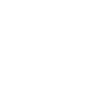

In [99]:
tess_4236.geometry.iloc[0]

In [98]:

h3.geo_to_h3shape(tess_4236.geometry.iloc[0])

<LatLngPoly: [72]>

In [56]:
res = h3.h3shape_to_cells(h3polys[0], res=5)

In [58]:
import h3

import geopandas
import contextily as cx
import matplotlib.pyplot as plt


def plot_df(df, column=None, ax=None):
    "Plot based on the `geometry` column of a GeoPandas dataframe"
    df = df.copy()
    df = df.to_crs(epsg=3857)  # web mercator

    if ax is None:
        _, ax = plt.subplots(figsize=(8,8))
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    df.plot(
        ax=ax,
        alpha=0.5, edgecolor='k',
        column=column, categorical=True,
        legend=True, legend_kwds={'loc': 'upper left'},
    )
    cx.add_basemap(ax, crs=df.crs, source=cx.providers.CartoDB.Positron)


def plot_shape(shape, ax=None):
    df = geopandas.GeoDataFrame({'geometry': [shape]}, crs='EPSG:4326')
    plot_df(df, ax=ax)

/home/krasen/eurofab_morphometrics/.pixi/envs/default/lib/python3.12/site-packages/contextily/tile.py:645: UserWarning: The inferred zoom level of 22 is not valid for the current tile provider (valid zooms: 0 - 20).
  warnings.warn(msg)


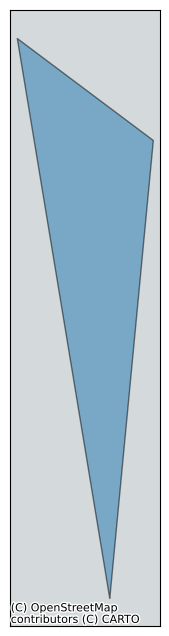

In [59]:
plot_shape(h3polys[0])

### why we using spatial kfold -  predictive model

In [3]:
region_id = 4182

tessellations_dir = graph_dir = enclosures_dir = '../data/ms_buildings/'
chars_dir = '../data/ms_buildings/chars/'

In [4]:
primary = pd.read_parquet(chars_dir + f'primary_chars_{region_id}.parquet')

In [5]:
tessellation = gpd.read_parquet(
        tessellations_dir + f"tessellation_{region_id}.parquet"
)

In [6]:
X_train = pd.read_parquet(chars_dir + f'primary_chars_{region_id}.parquet')

In [17]:
from sklearn.model_selection import train_test_split

In [18]:
X_train, X_test, y_train, y_test = train_test_split(X_train_subset, y, test_size=0.15, random_state=42)

In [19]:
clf = RandomForestClassifier(random_state=0, n_jobs=-1, verbose=True)

In [20]:
%%time
clf.fit(X_train, y_train)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    1.5s


CPU times: user 2min 24s, sys: 345 ms, total: 2min 24s
Wall time: 8.15 s


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.0s finished


RandomForestClassifier(n_jobs=-1, random_state=0, verbose=True)

In [21]:
clf.score(X_test, y_test)

[Parallel(n_jobs=20)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done 100 out of 100 | elapsed:    0.1s finished


0.9484593837535014

In [22]:
from sklearn import model_selection

gkf = model_selection.StratifiedGroupKFold(n_splits=5)
splits = gkf.split(
    X_train_subset,
    y,
    groups=tessellation_subset.enclosure_index,
)
split_label = np.empty(len(X_train_subset), dtype=float)
for i, (train, test) in enumerate(splits):
    split_label[test] = i

In [23]:
train = split_label != 0
X_train = X_train_subset.loc[train]
y_train = y[train]

test = split_label == 0
X_test = X_train_subset.loc[test]
y_test = y[test]

In [24]:
rf_spatial_cv = RandomForestClassifier(random_state=0, n_jobs=-1)
rf_spatial_cv.fit(X_train, y_train)

RandomForestClassifier(n_jobs=-1, random_state=0)

In [25]:
rf_spatial_cv.score(X_test, y_test)

0.6201246008062405

In [26]:
new_labels = clf.predict(X_train_subset)

[Parallel(n_jobs=20)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.1s
[Parallel(n_jobs=20)]: Done 100 out of 100 | elapsed:    0.6s finished


In [27]:
new_labels = rf_spatial_cv.predict(X_train_subset)

## All Scores

#### Test distribution

In [50]:
from core.generate_predictions import get_cluster_names, get_level_cut
import glob
import pandas as pd

test_countries_names = ['SK', 'PL', 'DE', 'AT', 'CZ', 'Random', 'Spatial']
column_order = ['Random', 'Spatial', 'OoS', 'SK', 'PL', 'DE', 'AT', 'CZ']

mapping_level = 4

In [51]:
def get_test_counts(traintestdir, mapping_level):

    all_cases = []
    
    for i in range(1, 8):
        ov_test_file = f'{traintestdir}{i}.pq'
        level_cut = get_level_cut(mapping_level)
        test_classes = pd.read_parquet(ov_test_file)['final_without_noise'].map(level_cut.to_dict())
        test_classes = test_classes.value_counts()
        
        cluster_names = get_cluster_names(mapping_level)
        test_classes.index = test_classes.index.map(cluster_names)
        test_classes = test_classes.sort_index()
        test_classes.name = test_countries_names[i - 1]
        all_cases.append(test_classes)

    all_cases = pd.DataFrame(all_cases)
    all_cases.columns.name = ''
    all_cases = all_cases.T
    
    return all_cases

In [80]:
ms_counts = get_test_counts('/data/uscuni-eurofab/processed_data/train_test_data/testing_labels', 4)
ms_counts.loc['Total', :] = ms_counts.sum(axis=0)


In [82]:
(ms_counts[['Random', 'Spatial', 'SK', 'PL', 'DE', 'AT', 'CZ']] / 1_000).astype(int).style.format("{:,d}")

,Random,Spatial,SK,PL,DE,AT,CZ
,,,,,,,
Aligned Winding Streets,"1,308","1,312",474,406,"5,219",245,195
Compact Development,"1,067","1,083",160,75,"5,041",33,23
Cul-de-Sac Layout,"1,023","1,027",358,400,"3,798",344,212
Dense Connected Developments,735,750,92,268,"2,971",138,207
Dense Standalone Buildings,818,785,273,"1,224","1,899",358,338
Dispersed Linear Development,136,133,36,613,31,0,2
Extensive Wide-Spaced Developments,113,104,26,329,130,20,61
Large Interconnected Blocks,36,33,3,8,138,21,11
Large Utilitarian Development,133,131,11,134,429,43,46


In [78]:
ov_counts = get_test_counts('/data/uscuni-eurofab-overture/processed_data/train_test_data/testing_labels', 4)
ov_counts.loc['Total', :] = ov_counts.sum(axis=0)

In [79]:
(ov_counts[['Random', 'Spatial', 'SK', 'PL', 'DE', 'AT', 'CZ']] / 1_000).astype(int).style.format("{:,d}")

,Random,Spatial,SK,PL,DE,AT,CZ
,,,,,,,
Aligned Winding Streets,"1,906","1,911",602,593,"7,681",334,320
Compact Development,"1,632","1,646",201,127,"7,708",75,48
Cul-de-Sac Layout,"1,354","1,362",446,484,"5,152",429,260
Dense Connected Developments,"1,850","1,843",157,662,"7,494",262,676
Dense Standalone Buildings,"1,062","1,073",324,"1,540","2,524",465,454
Dispersed Linear Development,163,167,40,740,35,0,3
Extensive Wide-Spaced Developments,175,186,63,468,215,35,94
Large Interconnected Blocks,216,218,11,45,872,82,70
Large Utilitarian Development,184,178,15,163,632,55,57


In [2]:
overall_accs = [pd.read_csv(f1fp).set_index('Unnamed: 0')['0'] for f1fp in sorted(glob.glob(f'/data/uscuni-eurofab/processed_data/results/overall_acc_{mapping_level}*'))]
overall_accs = pd.concat(overall_accs, axis=1)
overall_accs.index.name = ''
# overall_accs.columns = pd.MultiIndex.from_tuples((t, name) for t,name in zip(['MS building footprints'] * len(test_countries_names), test_countries_names))
overall_accs.columns = test_countries_names
overall_accs['OoS'] = overall_accs[['SK', 'PL', 'DE', 'AT', 'CZ',]].mean(axis=1)


overall_accs[column_order].style.format(precision=2)

,Random,Spatial,OoS,SK,PL,DE,AT,CZ
,,,,,,,,
Weighted F1,0.59,0.52,0.38,0.38,0.42,0.36,0.44,0.29
Micro F1,0.59,0.52,0.37,0.38,0.42,0.37,0.40,0.28
Macro F1,0.59,0.49,0.30,0.30,0.35,0.31,0.30,0.26


In [3]:
overall_accs2 = [pd.read_csv(f1fp).set_index('Unnamed: 0')['0'] for f1fp in sorted(glob.glob(f'/data/uscuni-eurofab-overture/processed_data/results/overall_acc_{mapping_level}*'))]
overall_accs2 = pd.concat(overall_accs2, axis=1)
overall_accs2.index.name = ''
# overall_accs2.columns = pd.MultiIndex.from_tuples((t, name) for t,name in zip(['Overture building footprints'] * len(test_countries_names), test_countries_names))
overall_accs2.columns = test_countries_names
overall_accs2['OoS'] = overall_accs2[['SK', 'PL', 'DE', 'AT', 'CZ',]].mean(axis=1)


overall_accs2[column_order].style.format(precision=2)

,Random,Spatial,OoS,SK,PL,DE,AT,CZ
,,,,,,,,
Weighted F1,0.70,0.55,0.41,0.35,0.43,0.41,0.49,0.39
Micro F1,0.70,0.54,0.40,0.34,0.43,0.41,0.46,0.36
Macro F1,0.71,0.54,0.34,0.30,0.38,0.35,0.36,0.32


In [4]:
f1s = [pd.read_csv(f1fp).set_index('Unnamed: 0')['0'] for f1fp in sorted(glob.glob(f'/data/uscuni-eurofab/processed_data/results/class_f1s_{mapping_level}*'))]
f1s = pd.concat(f1s, axis=1)
f1s.index.name = ''
f1s.columns = test_countries_names
f1s['OoS'] = f1s[['SK', 'PL', 'DE', 'AT', 'CZ',]].mean(axis=1)

f1s[column_order].sort_index().style.format(precision=2)

,Random,Spatial,OoS,SK,PL,DE,AT,CZ
,,,,,,,,
Aligned Winding Streets,0.51,0.45,0.28,0.35,0.21,0.36,0.28,0.18
Compact Development,0.59,0.55,0.13,0.15,0.09,0.24,0.09,0.08
Cul-de-Sac Layout,0.57,0.52,0.43,0.52,0.31,0.52,0.47,0.32
Dense Connected Developments,0.50,0.46,0.33,0.29,0.29,0.45,0.33,0.29
Dense Standalone Buildings,0.63,0.56,0.54,0.53,0.65,0.38,0.55,0.57
Dispersed Linear Development,0.91,0.64,0.19,0.17,0.34,0.18,0.06,0.18
Extensive Wide-Spaced Developments,0.41,0.31,0.25,0.25,0.46,0.13,0.19,0.25
Large Interconnected Blocks,0.36,0.28,0.24,0.22,0.17,0.37,0.30,0.15
Large Utilitarian Development,0.49,0.40,0.32,0.23,0.34,0.36,0.34,0.34


In [5]:
f1s2 = [pd.read_csv(f1fp).set_index('Unnamed: 0')['0'] for f1fp in sorted(glob.glob(f'/data/uscuni-eurofab-overture/processed_data/results/class_f1s_{mapping_level}*'))]
f1s2 = pd.concat(f1s2, axis=1)
f1s2.index.name = ''
f1s2.columns = test_countries_names
f1s2['OoS'] = f1s2[['SK', 'PL', 'DE', 'AT', 'CZ',]].mean(axis=1)

f1s2[column_order].sort_index().style.format(precision=2)

,Random,Spatial,OoS,SK,PL,DE,AT,CZ
,,,,,,,,
Aligned Winding Streets,0.61,0.46,0.29,0.28,0.27,0.37,0.31,0.25
Compact Development,0.66,0.55,0.16,0.09,0.12,0.30,0.18,0.11
Cul-de-Sac Layout,0.65,0.51,0.42,0.48,0.31,0.50,0.47,0.32
Dense Connected Developments,0.67,0.58,0.43,0.30,0.44,0.58,0.39,0.44
Dense Standalone Buildings,0.69,0.57,0.53,0.53,0.63,0.36,0.53,0.61
Dispersed Linear Development,0.96,0.65,0.16,0.09,0.31,0.16,0.07,0.19
Extensive Wide-Spaced Developments,0.52,0.36,0.27,0.30,0.47,0.13,0.23,0.22
Large Interconnected Blocks,0.69,0.60,0.46,0.41,0.35,0.57,0.57,0.42
Large Utilitarian Development,0.60,0.44,0.37,0.28,0.37,0.42,0.38,0.41
